In [1]:
#EDA (Exploratory Data Analysis)
#Provider Demographics and Behavior

In [3]:
pip install matplotlib

   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   - -------------------------------------- 0.3/7.8 MB ? eta -:--:--
   ---- ----------------------------------- 0.8/7.8 MB 2.1 MB/s eta 0:00:04
   ------ --------------------------------- 1.3/7.8 MB 2.2 MB/s eta 0:00:03
   --------- ------------------------------ 1.8/7.8 MB 2.3 MB/s eta 0:00:03
   ------------ --------------------------- 2.4/7.8 MB 2.3 MB/s eta 0:00:03
   -------------- ------------------------- 2.9/7.8 MB 2.3 MB/s eta 0:00:03
   ----------------- ---------------------- 3.4/7.8 MB 2.3 MB/s eta 0:00:02
   ------------------ --------------------- 3.7/7.8 MB 2.4 MB/s eta 0:00:02
   --------------------- ------------------ 4.2/7.8 MB 2.4 MB/s eta 0:00:02
   ------------------------ --------------- 4.7/7.8 MB 2.4 MB/s eta 0:00:02
   -------------------------- ------------- 5.2/7.8 MB 2.4 MB/s eta 0:00:02
   ----------------------------- ---------- 5.8/7.8 MB 2.4 MB/s eta 0:00:01
   -----------------------

In [8]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


Provider Type Distribution:
 Provider Type
Diagnostic Radiology                                12537
Internal Medicine                                   11366
Family Practice                                      9760
Nurse Practitioner                                   5713
Cardiology                                           4602
                                                    ...  
Certified Nurse Midwife                                 7
Radiation Therapy Center                                3
Mammography Center                                      3
Pharmacy                                                1
Advanced Heart Failure and Transplant Cardiology        1
Name: count, Length: 90, dtype: int64


C:\Users\RAMANA JSRA\AppData\Local\Temp\ipykernel_22356\2895126153.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=provider_type_counts.index, x=provider_type_counts.values, palette="viridis")


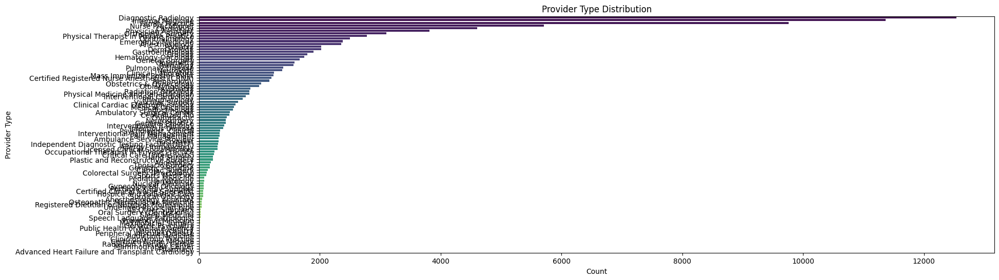

Gender Distribution:
 Gender of the Provider
M    66641
F    29105
Name: count, dtype: int64


C:\Users\RAMANA JSRA\AppData\Local\Temp\ipykernel_22356\2895126153.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Gender of the Provider', data=data, palette="pastel")


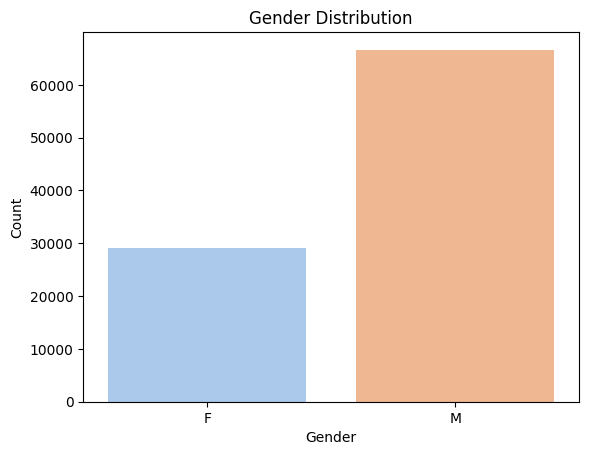

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# Load dataset
file_path = "Dl_project/Healthcare Providers.csv"  # Update with your file path if running locally
data = pd.read_csv(file_path)

# Set display options for better readability
pd.set_option('display.max_columns', None)

# 1. Provider Demographics and Behavior
## Provider Type Distribution
provider_type_counts = data['Provider Type'].value_counts()
print("Provider Type Distribution:\n", provider_type_counts)

# Bar chart for provider types
plt.figure(figsize=(20, 6))
sns.barplot(y=provider_type_counts.index, x=provider_type_counts.values, palette="viridis")
plt.title("Provider Type Distribution")
plt.xlabel("Count")
plt.ylabel("Provider Type")
plt.show()

## Gender Analysis
gender_counts = data['Gender of the Provider'].value_counts()
print("Gender Distribution:\n", gender_counts)

# Bar chart for gender distribution
sns.countplot(x='Gender of the Provider', data=data, palette="pastel")
plt.title("Gender Distribution")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()

# Boxplot for financial metrics by gender
plt.figure(figsize=(10, 6))
sns.boxplot(x='Gender of the Provider', y='Average Medicare Payment Amount', data=data)
plt.title("Financial Comparison by Gender")
plt.xlabel("Gender")
plt.ylabel("Average Medicare Payment Amount")
plt.show()




State-wise Provider Distribution:
 State Code of the Provider
CA    7713
FL    7217
TX    6827
NY    6328
PA    4548
IL    4055
NC    3709
OH    3648
MI    3502
NJ    3311
GA    2849
MA    2782
VA    2781
TN    2668
IN    2198
MD    2063
WA    2011
MO    1987
AZ    1984
WI    1830
AL    1813
SC    1745
KY    1662
MN    1562
LA    1516
CO    1414
CT    1396
OK    1247
IA    1132
AR    1126
MS    1106
KS    1105
OR    1046
NE     784
NV     700
WV     638
UT     634
NH     545
ME     463
NM     419
ID     414
DE     377
RI     359
MT     345
SD     320
PR     283
DC     273
HI     249
VT     238
ND     231
WY     171
AK     164
VI      19
GU      15
ZZ       6
AP       3
AE       2
AA       1
Name: count, dtype: int64


Top Cities with Most Providers:
 City of the Provider
NEW YORK        1052
HOUSTON          868
CHICAGO          756
PHILADELPHIA     656
BOSTON           631
DALLAS           619
COLUMBUS         606
BALTIMORE        603
BROOKLYN         603
SPRINGFIELD      591
Name: count, dtype: int64


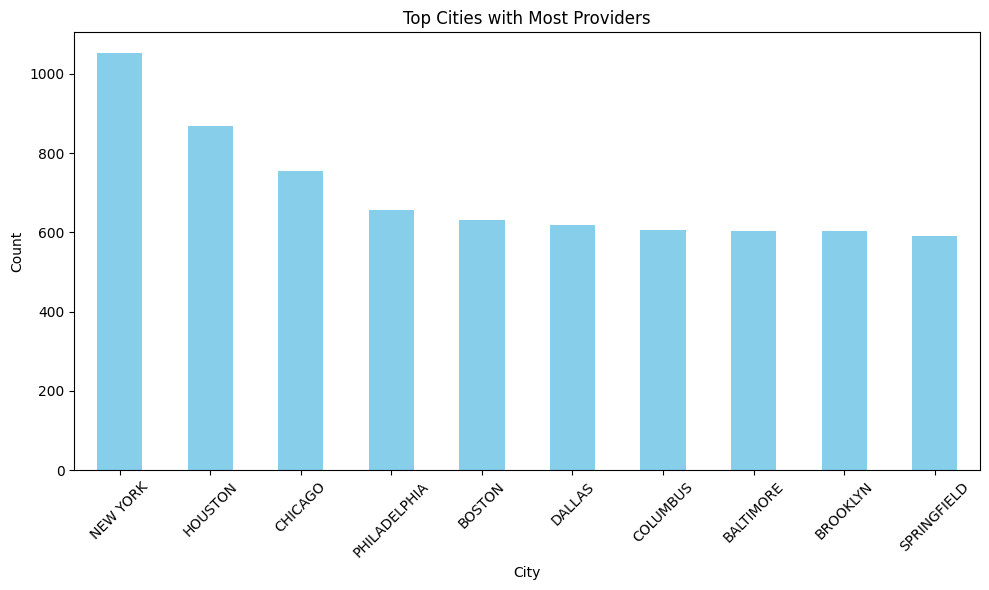

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

# 1. State-wise Distribution
# Ensure the 'Average Medicare Payment Amount' column is numeric
data['Average Medicare Payment Amount'] = pd.to_numeric(data['Average Medicare Payment Amount'], errors='coerce')

# Drop rows with NaN values in 'Average Medicare Payment Amount' (optional, based on your analysis needs)
data = data.dropna(subset=['Average Medicare Payment Amount'])

# Count providers per state
state_counts = data['State Code of the Provider'].value_counts()
print("State-wise Provider Distribution:\n", state_counts)

# Average payment per state
state_group = data.groupby('State Code of the Provider')['Average Medicare Payment Amount'].mean()

# Plot heatmap for state-wise average payments
fig = px.choropleth(state_group.reset_index(),
                    locations='State Code of the Provider',
                    locationmode='USA-states',
                    color='Average Medicare Payment Amount',
                    scope='usa',
                    title='Average Medicare Payment by State',
                    color_continuous_scale='Blues')
fig.show()

# 2. City-wise Analysis
# Count providers per city and display the top 10 cities
city_counts = data['City of the Provider'].value_counts().head(10)
print("Top Cities with Most Providers:\n", city_counts)

# Bar chart for top cities
plt.figure(figsize=(10, 6))
city_counts.plot(kind='bar', color='skyblue')
plt.title("Top Cities with Most Providers")
plt.xlabel("City")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Average Submitted Charge Amount    float64
Average Medicare Payment Amount    float64
dtype: object
       Charge_to_Payment_Ratio
count             93277.000000
mean                  4.846008
std                  19.616736
min                   0.883623
25%                   2.237623
50%                   3.251517
75%                   4.838848
max                2676.153842


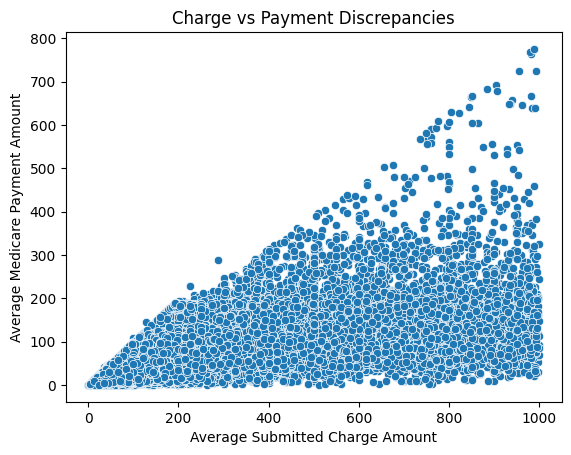

In [25]:
# 3. Financial Performance
## Charge vs Payment Discrepancies
print(data[['Average Submitted Charge Amount', 'Average Medicare Payment Amount']].dtypes)
data['Average Submitted Charge Amount'] = pd.to_numeric(data['Average Submitted Charge Amount'], errors='coerce')
data['Average Medicare Payment Amount'] = pd.to_numeric(data['Average Medicare Payment Amount'], errors='coerce')
data['Charge_to_Payment_Ratio'] = data['Average Submitted Charge Amount'] / data['Average Medicare Payment Amount']
print(data[['Charge_to_Payment_Ratio']].describe())

import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(x='Average Submitted Charge Amount', y='Average Medicare Payment Amount', data=data)
plt.title("Charge vs Payment Discrepancies")
plt.xlabel("Average Submitted Charge Amount")
plt.ylabel("Average Medicare Payment Amount")
plt.show()


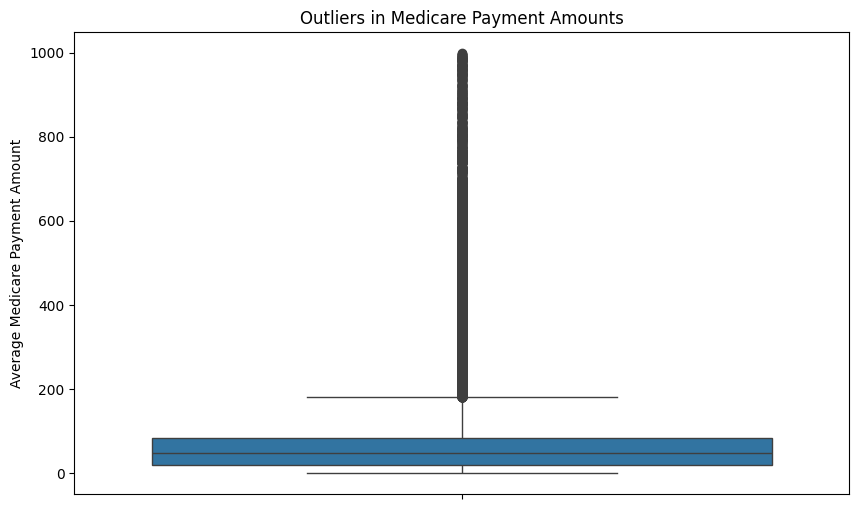

In [26]:
# 4. Anomaly Detection
## Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(y='Average Medicare Payment Amount', data=data)
plt.title("Outliers in Medicare Payment Amounts")
plt.ylabel("Average Medicare Payment Amount")
plt.show()



In [32]:
# 5. Service Metrics
## Service Volume Trends
# Check for missing or invalid data
print(data[['Number of Services', 'Average Medicare Payment Amount', 'Charge_to_Payment_Ratio']].isnull().sum())
# Drop rows with missing values in the relevant columns
data = data.dropna(subset=['Number of Services', 'Average Medicare Payment Amount', 'Charge_to_Payment_Ratio'])

# Alternatively, fill missing values with a default
data['Charge_to_Payment_Ratio'].fillna(0, inplace=True)
# Convert columns to numeric if needed
data['Number of Services'] = pd.to_numeric(data['Number of Services'], errors='coerce')
data['Average Medicare Payment Amount'] = pd.to_numeric(data['Average Medicare Payment Amount'], errors='coerce')
data['Charge_to_Payment_Ratio'] = pd.to_numeric(data['Charge_to_Payment_Ratio'], errors='coerce')
import plotly.express as px

fig = px.scatter(
    data,
    x='Number of Services',
    y='Average Medicare Payment Amount',
    size='Charge_to_Payment_Ratio',
    color='Provider Type',
    title='Service vs Payment Amount'
)
fig.show()
# Verify values are in a reasonable range
print(data[['Charge_to_Payment_Ratio']].describe())



Number of Services                 0
Average Medicare Payment Amount    0
Charge_to_Payment_Ratio            0
dtype: int64


C:\Users\RAMANA JSRA\AppData\Local\Temp\ipykernel_22356\1535698289.py:7: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





       Charge_to_Payment_Ratio
count             90664.000000
mean                  4.784744
std                  19.587803
min                   0.883623
25%                   2.242748
50%                   3.260785
75%                   4.838128
max                2676.153842


Missing Data Summary:
                                                     Missing Values  Percentage
index                                                            0    0.000000
National Provider Identifier                                     0    0.000000
Last Name/Organization Name of the Provider                      0    0.000000
First Name of the Provider                                    3296    3.635401
Middle Initial of the Provider                               26219   28.918865
Credentials of the Provider                                   6023    6.643210
Gender of the Provider                                        3295    3.634298
Entity Type of the Provider                                      0    0.000000
Street Address 1 of the Provider                                 0    0.000000
Street Address 2 of the Provider                             54038   59.602488
City of the Provider                                             0    0.000000
Zip Code of the Provider     

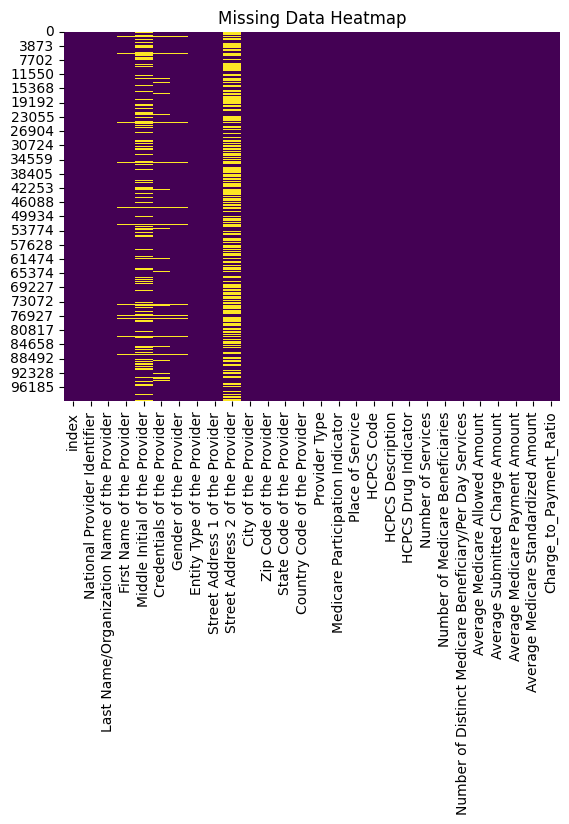

Number of Duplicated Rows: 0


In [33]:

# 6. Data Quality and Patterns
## Missing Data Patterns
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
print("Missing Data Summary:\n", missing_data)

# Heatmap for missing data
sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Data Heatmap")
plt.show()

# Duplication and Consistency Checks
duplicates = data.duplicated().sum()
print(f"Number of Duplicated Rows: {duplicates}")